# Seurat clustering of NK-data (Karaiskos et al., 2017)

In [1]:
#loading packages
library(Seurat)
library(magrittr)
library(dplyr)
library(ggplot2)
library(R.utils)
library(MAST)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: R.oo

Loading required package: R.methodsS3

R.methodsS3 v1.8.1 (2020-08-26 16:20:06 UTC) successfully loaded. See ?R.methodsS3 for help.

R.oo v1.24.0 (2020-08-26 16:11:58 UTC) successfully loaded. See ?R.oo for help.


Attaching package: ‘R.oo’


The following object is masked from ‘package:R.methodsS3’:

    throw


The following object is masked from ‘package:magrittr’:

    equals


The following objects are masked from ‘package:methods’:

    getClasses, getMethods


The following objects are masked from ‘package:base’:

    attach, detach, load, save


R.utils v2.10.1 (2020-08-26 22:50:31 UTC) successfully loaded. See ?R.utils for help.


Attaching package: ‘R.utils’


The following object is masked from ‘package:magrittr’:

    extract


The following obj

In [2]:
count.table <- read.csv(file = '../../data/original_data/NK-data/umi_count_table_HQC_NK.csv')
head(count.table)
dim(count.table)

,GSM2494786_GTACCCATAAGA,GSM2494786_TCATCTTATACA,GSM2494786_CGAAGAACAAGA,GSM2494786_CAGAACAAACGA,GSM2494786_AGCTTACTAATC,GSM2494786_GTACGCAATCAT,GSM2494786_TTCCAGCTATTG,GSM2494786_CGTTACCCTGTC,GSM2494786_TGCACCGGCCGA,GSM2494786_ACTACAAACTTT,⋯,GSM2494784_TTAGAGTTTTCC,GSM2494784_GTGATGTTACAT,GSM2494784_AGGCCCCATCAA,GSM2494784_CAAGCGGGTAAT,GSM2494784_CCCATTCTTTTG,GSM2494784_CCGTACTGTTCT,GSM2494784_GAGTGGCCTTGA,GSM2494784_TATTAAATTCAG,GSM2494784_TCGAATAACTCC,GSM2494784_CTTCATAGGAGT
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
128up,5,1,3,4,1,2,4,1,3,1,⋯,0,0,0,0,1,3,0,0,0,1
14-3-3epsilon,238,200,167,162,239,127,125,182,159,132,⋯,40,37,34,36,59,108,88,37,43,152
14-3-3zeta,29,37,25,26,22,15,28,23,23,21,⋯,4,10,3,10,13,16,14,10,7,22
140up,0,3,1,1,4,5,1,0,3,0,⋯,0,0,0,0,0,5,1,0,0,3
18SrRNA-Psi:CR41602,17,23,14,17,11,16,20,21,15,19,⋯,4,7,2,4,10,13,13,2,4,12
18SrRNA-Psi:CR45861,17,14,20,14,12,14,13,14,16,10,⋯,1,3,3,2,2,9,6,2,3,1


[1] 14121  1692

In [3]:
seu_HQC <- CreateSeuratObject(count.table) 
seu_HQC

An object of class Seurat 
14121 features across 1692 samples within 1 assay 
Active assay: RNA (14121 features, 0 variable features)

In [4]:
is.mt <- grepl(pattern = '^mt:', x = row.names(seu_HQC))
is.rRNA <- grepl(pattern = 'rRNA', x = row.names(seu_HQC))
is.rRNA <- is.rRNA & (!is.mt)
mt.list <- row.names(seu_HQC)[is.mt]
rRNA.list <- row.names(seu_HQC)[is.rRNA]
head(rRNA.list)

[1] "18SrRNA-Psi:CR41602" "18SrRNA-Psi:CR45861" "28SrRNA-Psi:CR40741"
[4] "28SrRNA-Psi:CR41609" "28SrRNA-Psi:CR45853" "28SrRNA-Psi:CR45855"

In [5]:
seu_HQC[["percent.mt"]] <- PercentageFeatureSet(seu_HQC, pattern = "^mt:")
seu_HQC[["percent.rRNA"]] <- PercentageFeatureSet(seu_HQC, features = rRNA.list)

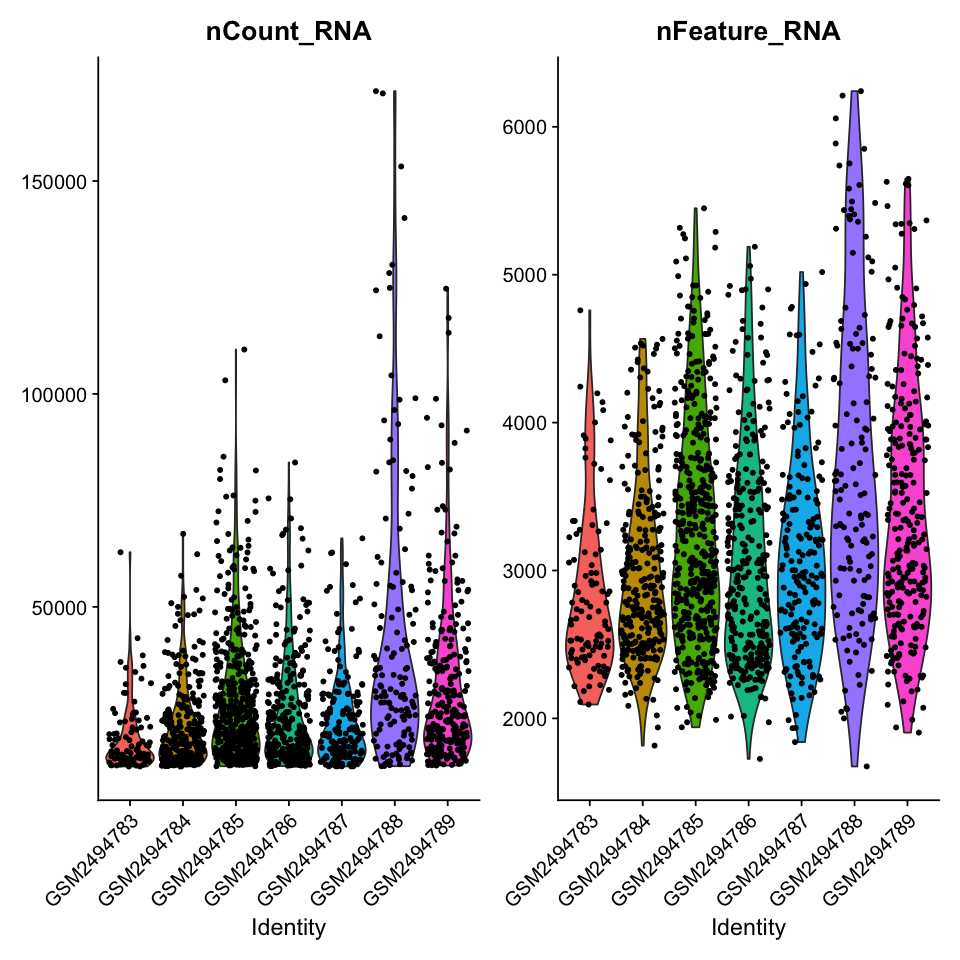

In [6]:
options(repr.plot.width=8, repr.plot.height=8)
VlnPlot(seu_HQC, features = c('nCount_RNA', 'nFeature_RNA'))

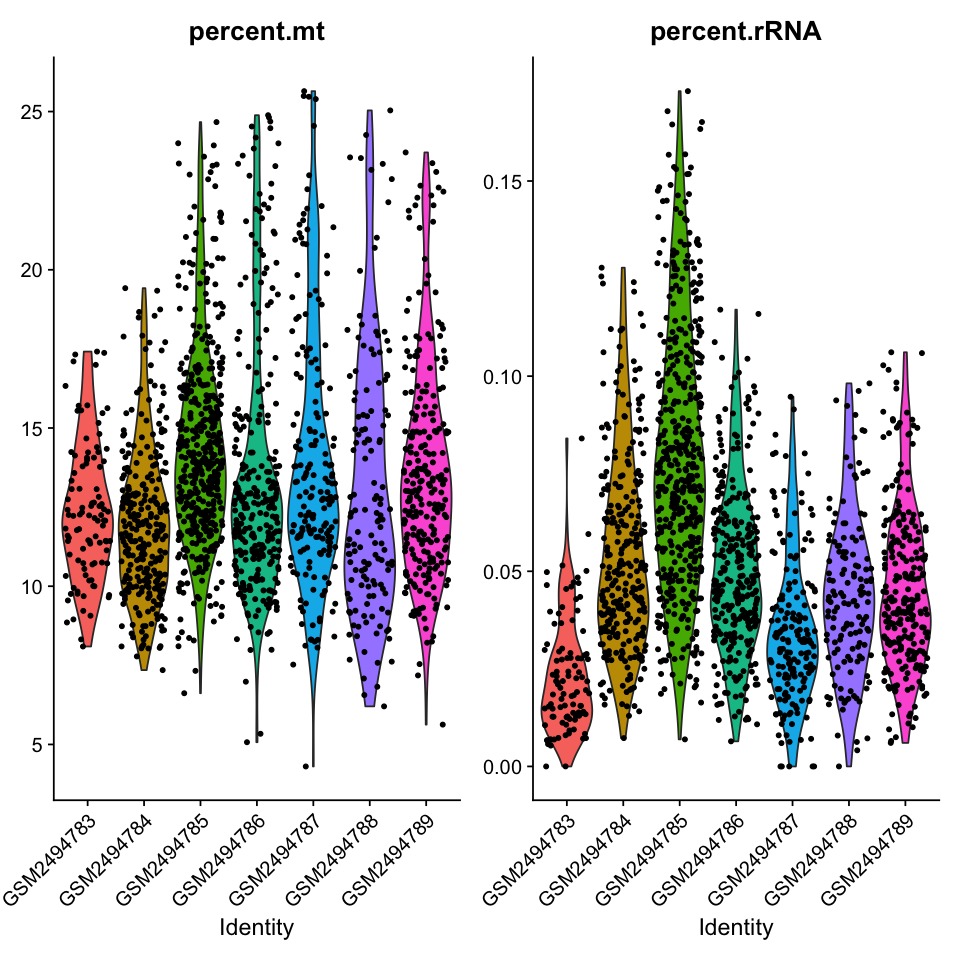

In [7]:
VlnPlot(seu_HQC, features = c('percent.mt', 'percent.rRNA'))

In [8]:
summary(seu_HQC$nCount_RNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  12522   15980   21818   27725   32518  171098 

In [9]:
summary(seu_HQC$nFeature_RNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1675    2601    3032    3206    3664    6241 

In [10]:
summary(seu_HQC$percent.mt)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  4.304  11.103  12.761  13.430  15.043  25.645 

In [11]:
summary(seu_HQC$percent.rRNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.03265 0.04824 0.05425 0.07070 0.17303 

### Normalize

In [12]:
seu_HQC <- suppressWarnings(SCTransform(seu_HQC, vars.to.regress = c('percent.mt','percent.rRNA'), verbose = FALSE))

In [13]:
seu_HQC <- RunPCA(seu_HQC,npcs = 100)

PC_ 1 
Positive:  Ilp4, hll, twi, VepD, sna, Cyp310a1, CG12177, Mes2, zfh1, CG14688 
	   CadN, CG3036, CG16758, ltl, Nplp2, stumps, sty, Act87E, htl, CG43355-sala 
	   Pka-C3, Mef2, if, tin, CG9005, stg, Mdr49, lncRNA:CR45361, Asph, pigs 
Negative:  CG13427, Lac, CG34224, Tom, cv-2, CG15628, sdt, Atx-1, kek1, Ptr 
	   Doc1, grh, Brd, CG10035, CG5059, aop, ASPP, BobA, Dtg, tup 
	   rho, egr, pnr, Ppa, ths, CG14915, SoxN, CG45263, Doc3, 5-HT2A 
PC_ 2 
Positive:  emc, egr, Doc1, kek1, tup, phu, Ama, Doc3, srp, Doc2 
	   peb, Dtg, mirr, cv-2, hbs, Ance, CG45263, Z600, net, bun 
	   CG12420, MFS14, ush, CG13653, zen, CG15236, CG14427, Alk, pnr, Nrt 
Negative:  SoxN, sog, ths, sca, ImpL2, brk, slp1, tra, CG5059, Pino 
	   CG43355-sala, CG13427, D, Dl, gsb, Cys, CG15628, pyr, CG34224, HnRNP-K 
	   Meltrin, mid, CG42662-CG30080, sad, wb, rdx, Obp99a, Tollo, Atx-1, vnd 
PC_ 3 
Positive:  Ama, Ilp4, twi, Nrt, hll, Df31, VepD, hth, net, Cyp310a1 
	   CadN, sna, CG12177, ftz, zfh1, Bacc, wech, tsh

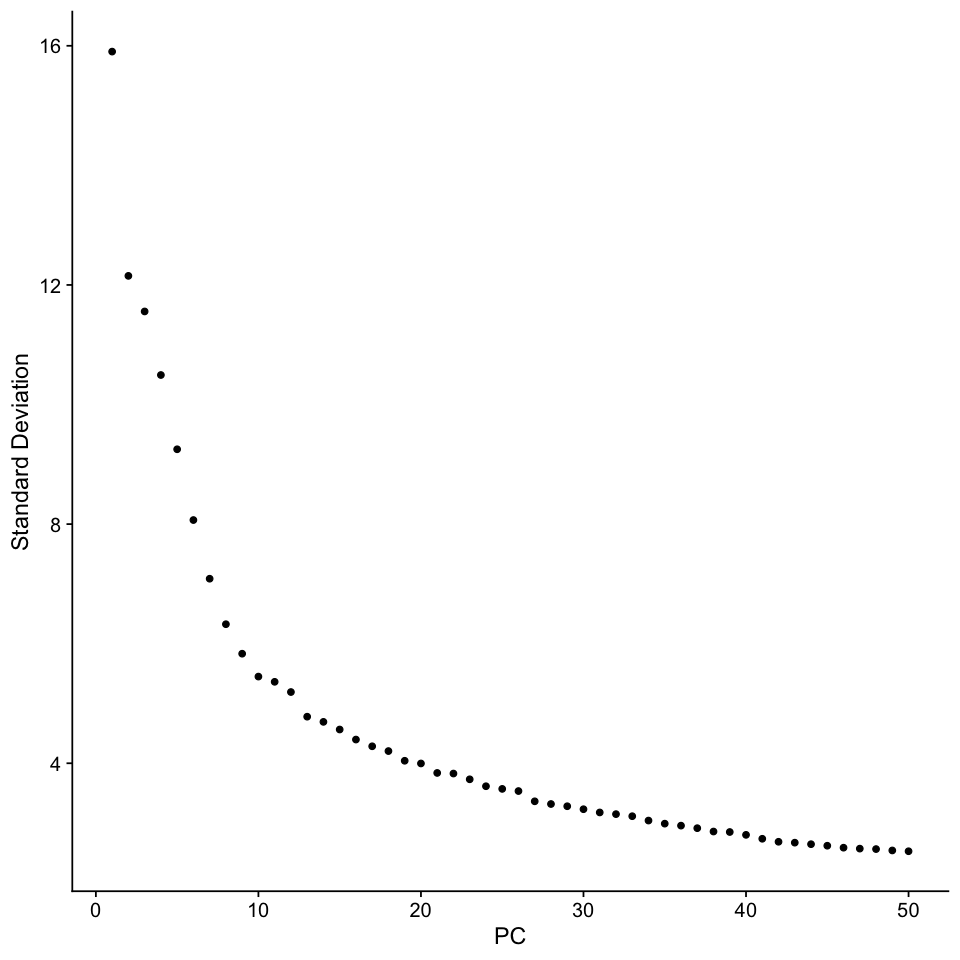

In [14]:
# VariableFeaturePlot(seu_HQC)
ElbowPlot(seu_HQC, ndims = 50)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


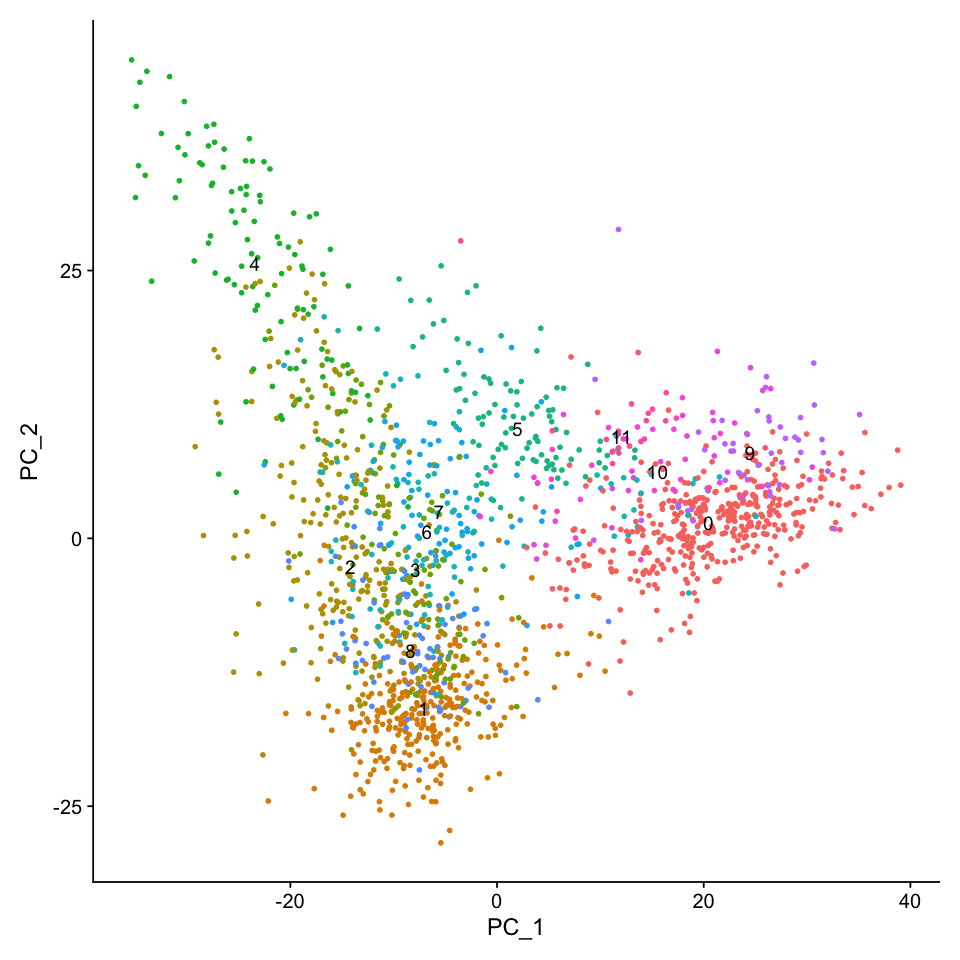

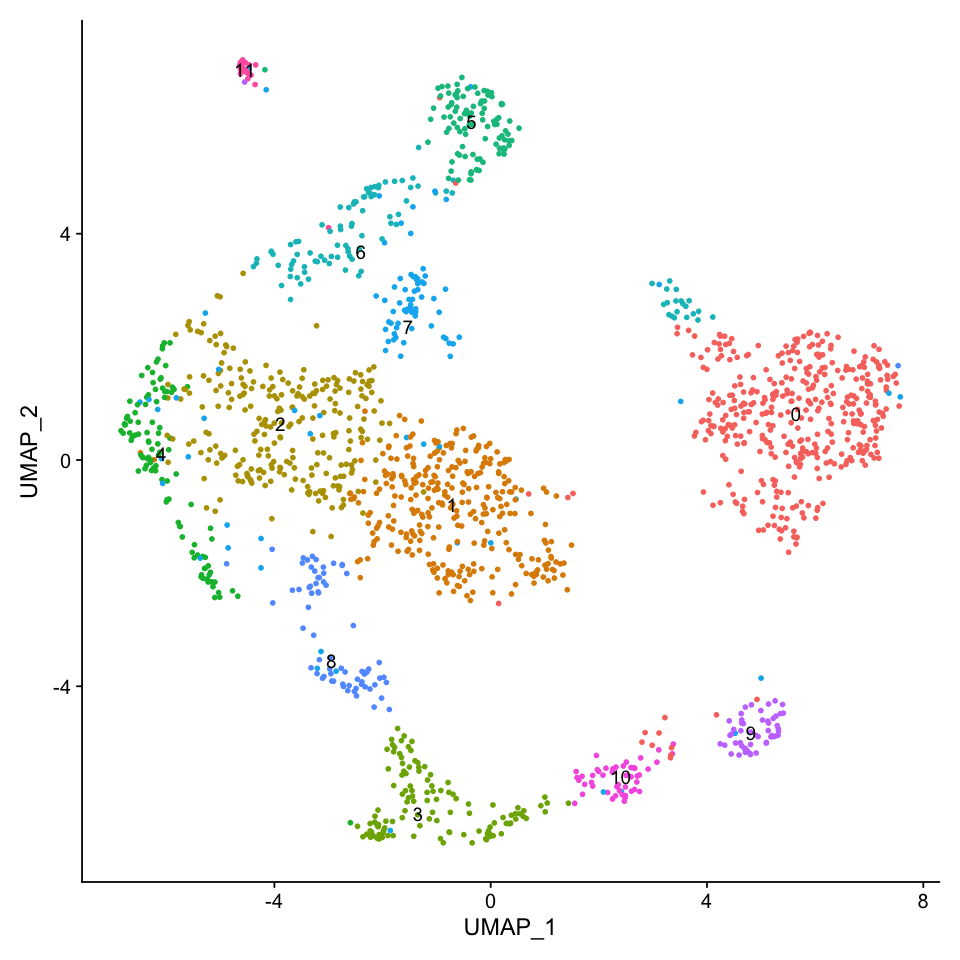

In [15]:
seu_HQC <- RunUMAP(seu_HQC, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC <- FindNeighbors(seu_HQC, dims = 1:30, verbose = FALSE)
seu_HQC <- FindClusters(seu_HQC, verbose = FALSE)
DimPlot(seu_HQC, reduction =  "pca", label = TRUE) + NoLegend()
DimPlot(seu_HQC, reduction =  "umap", label = TRUE) + NoLegend()

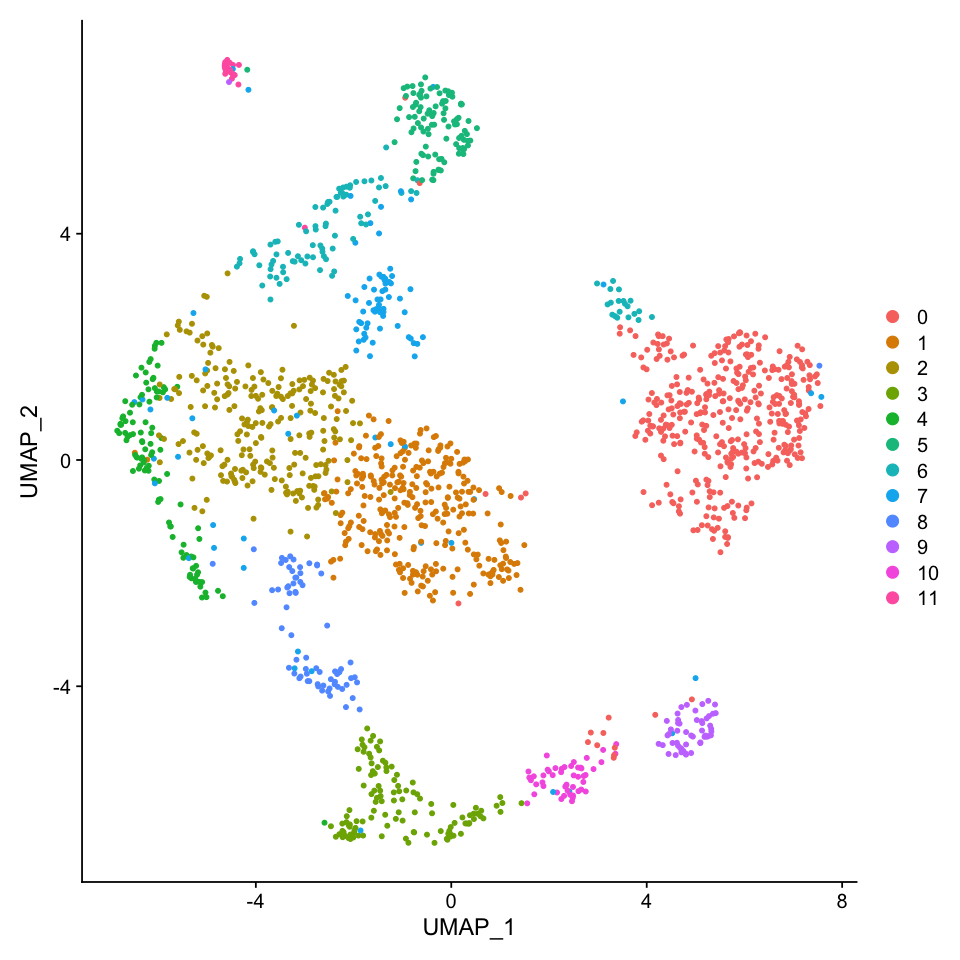

In [16]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC,pt.size = 1)

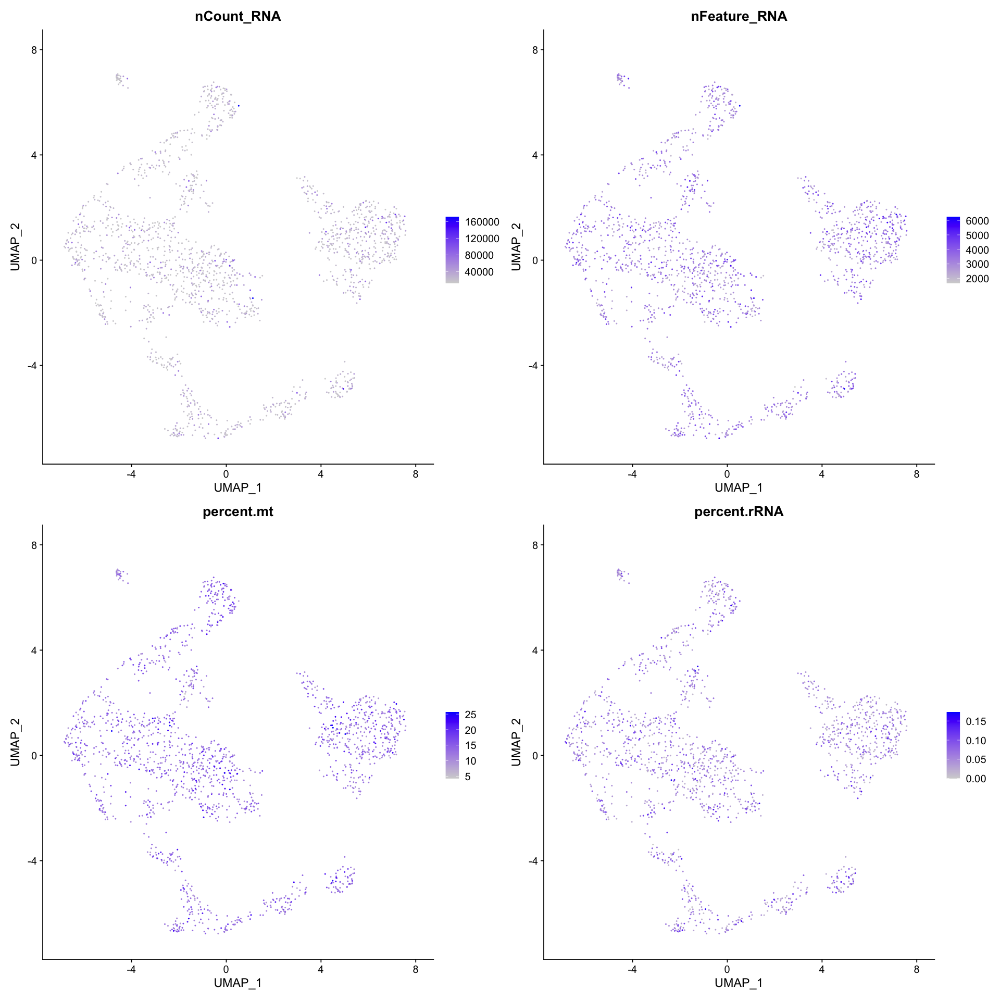

In [17]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = "umap", features = c("nCount_RNA", "nFeature_RNA", 
                               "percent.mt", "percent.rRNA"), pt.size = 0.2,  ncol = 2)

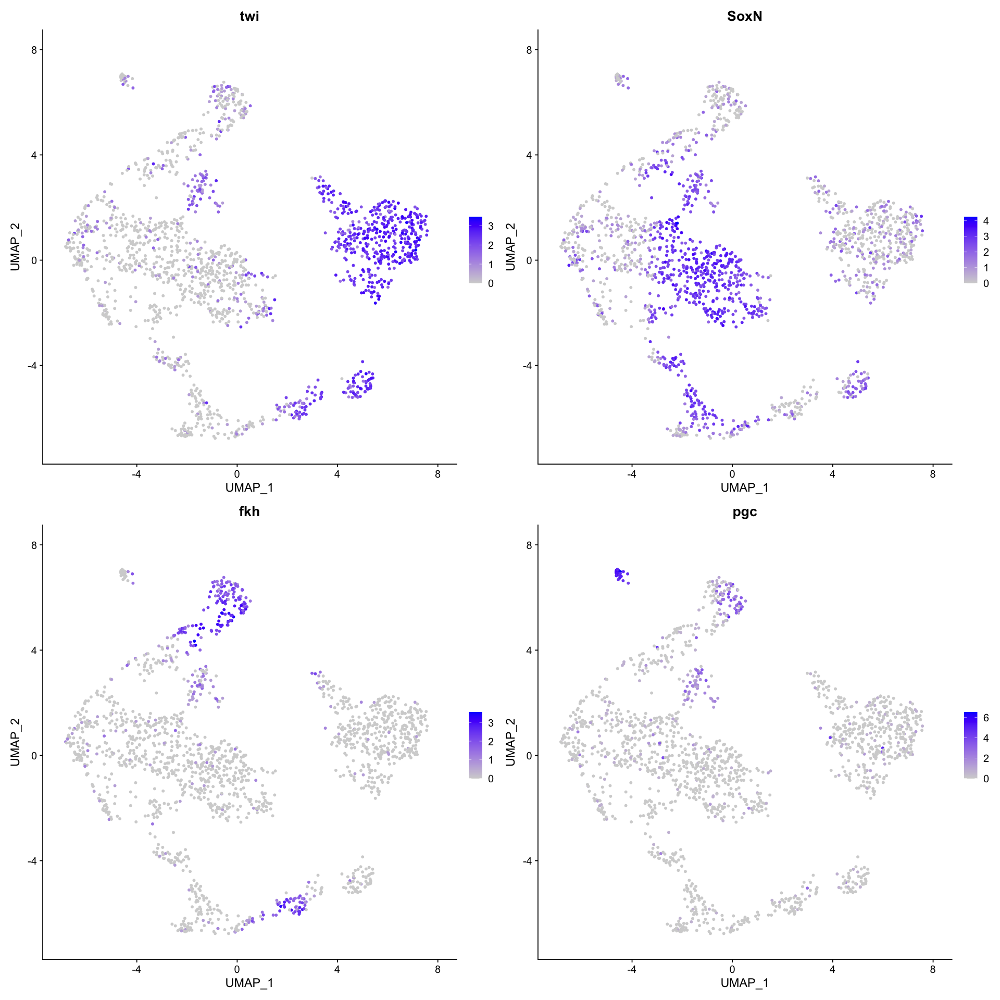

In [18]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, features = c('twi','SoxN','fkh','pgc'), ncol = 2, pt.size = 1)

In [19]:
all.markers <- FindAllMarkers(seu_HQC, only.pos = TRUE)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11



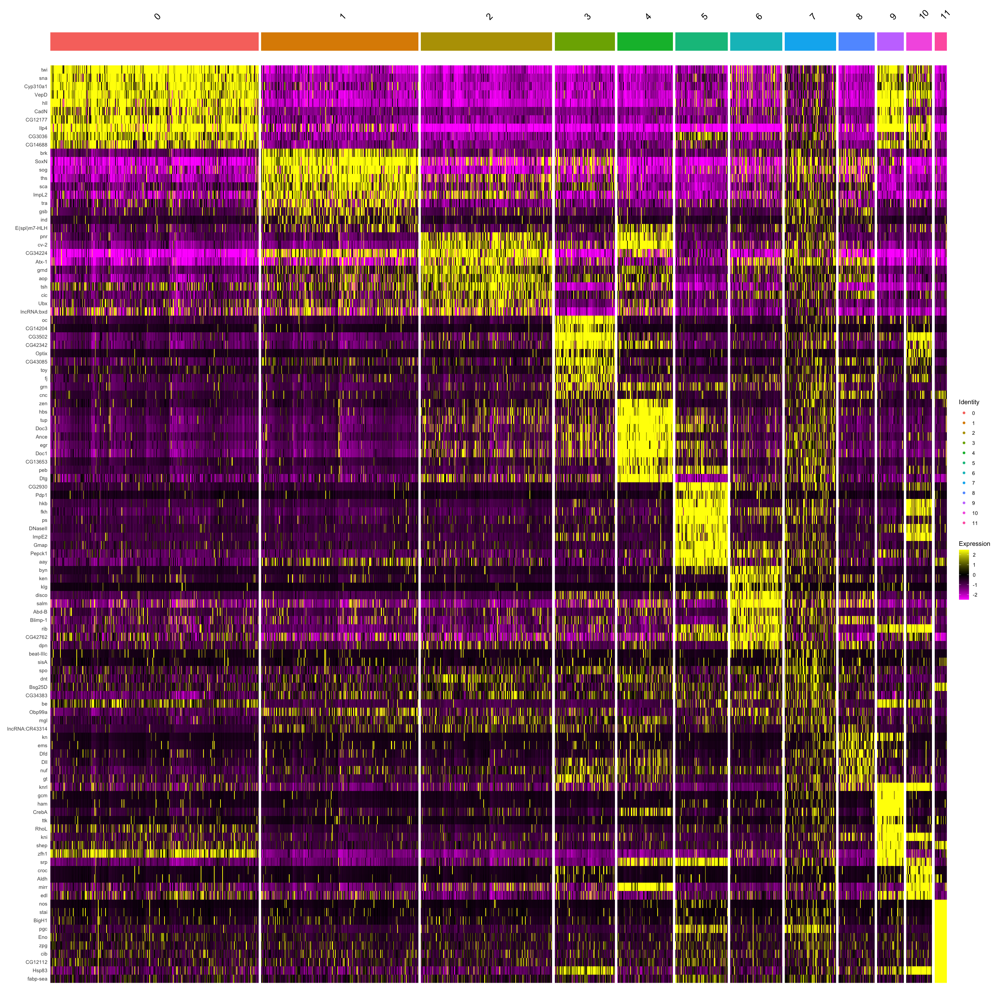

In [20]:
options(repr.plot.width=24, repr.plot.height=24)
DoHeatmap(seu_HQC, features = all.markers.top10$gene)

Cluster 7 do not show the marker gene expression.   
They seem to be doublets.  

Re-analysing data without cluster 7.

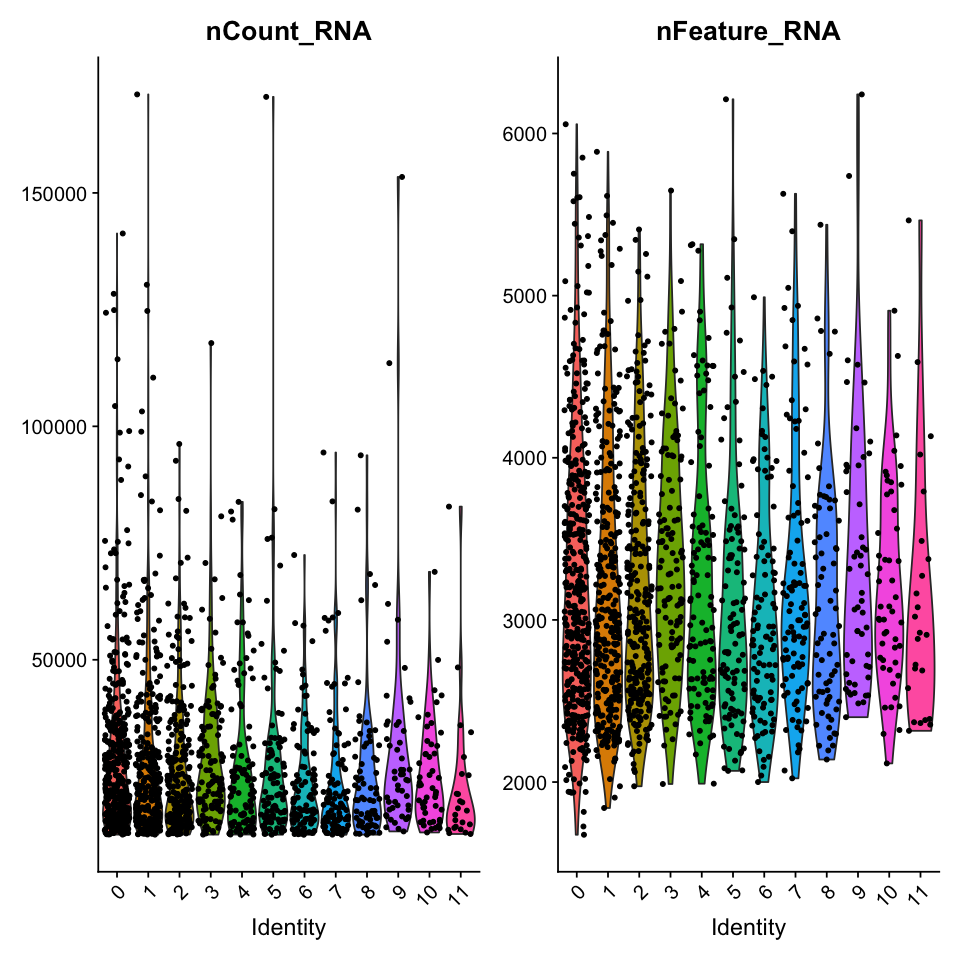

In [21]:
options(repr.plot.width=8, repr.plot.height=8)
VlnPlot(seu_HQC, features = c('nCount_RNA', 'nFeature_RNA'))

### Clustering without doublets

In [22]:
seu_HQC2 <- subset(seu_HQC, idents = c(7), invert = TRUE)

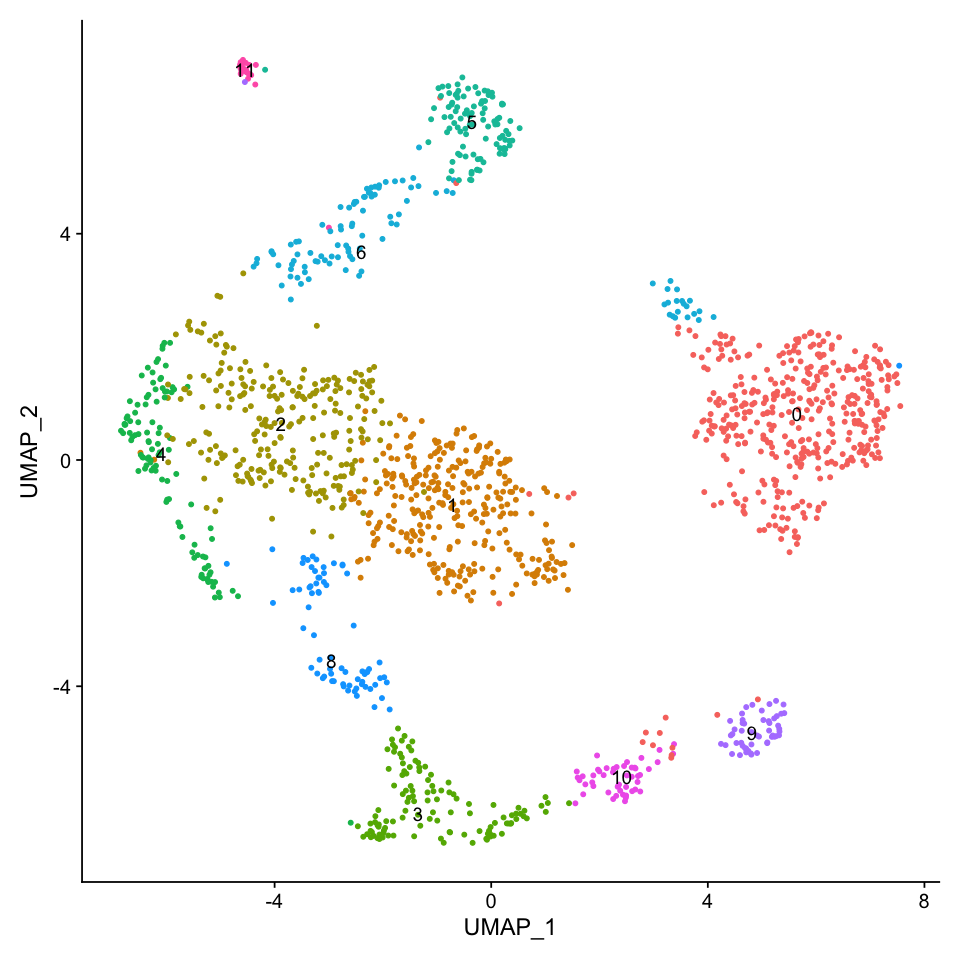

In [23]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC2,label = TRUE) + NoLegend()

In [24]:
DefaultAssay(seu_HQC2) <- 'RNA'

In [25]:
seu_HQC2 <- suppressWarnings(SCTransform(seu_HQC2, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE))

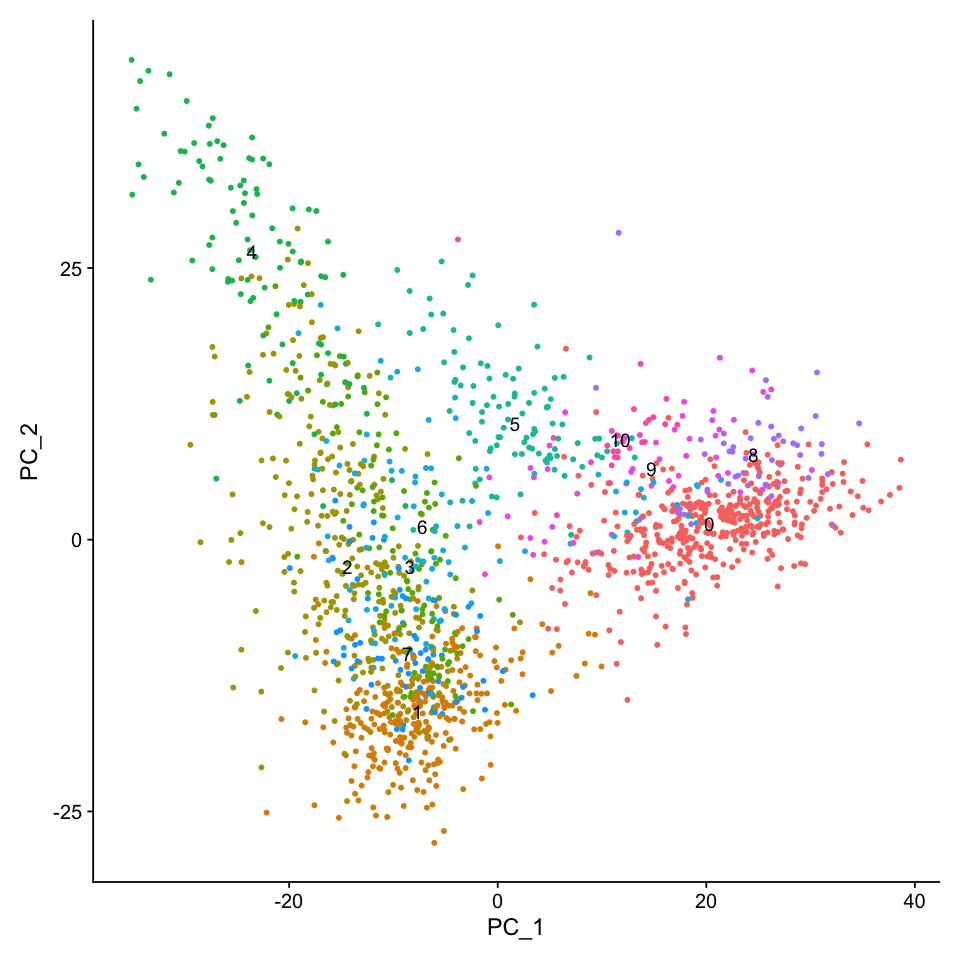

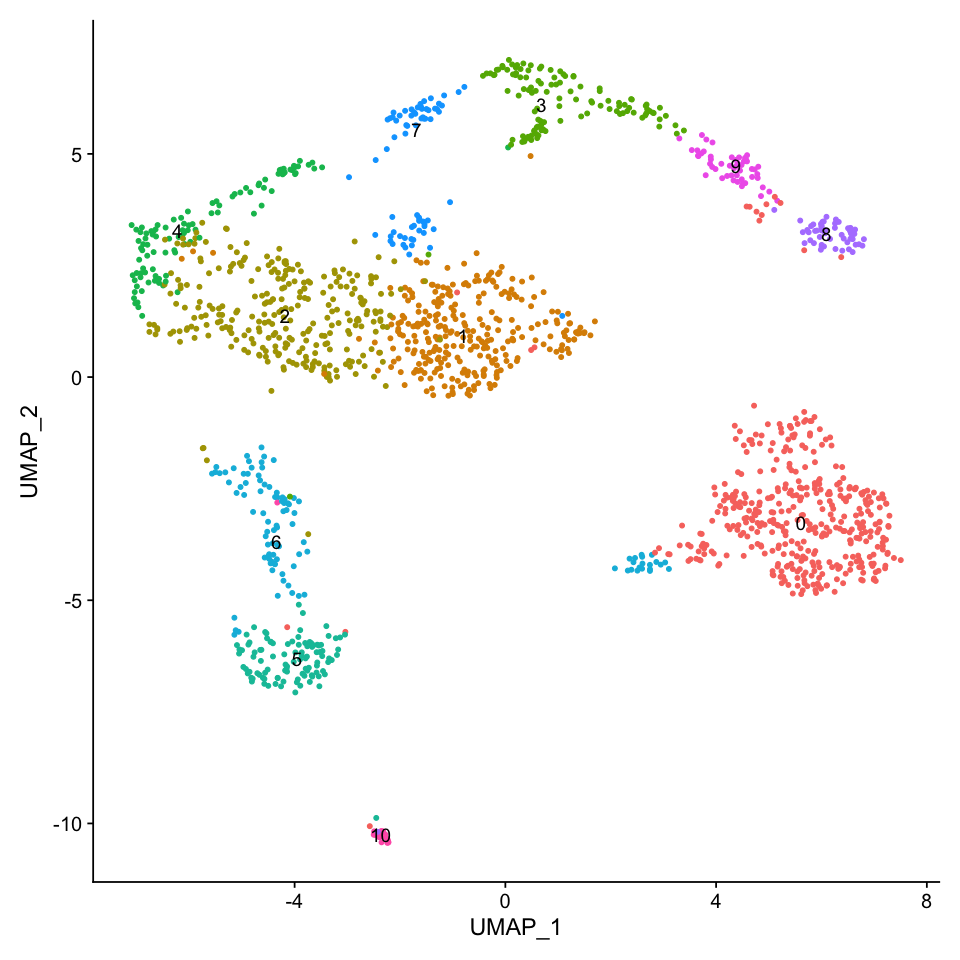

In [26]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC2 <- RunPCA(seu_HQC2, verbose = FALSE)
seu_HQC2 <- RunUMAP(seu_HQC2, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC2 <- FindNeighbors(seu_HQC2, dims = 1:30, verbose = FALSE)
seu_HQC2 <- FindClusters(seu_HQC2, verbose = FALSE)
DimPlot(seu_HQC2, reduction =  "pca", label = TRUE) + NoLegend()
DimPlot(seu_HQC2, reduction =  "umap", label = TRUE) + NoLegend()

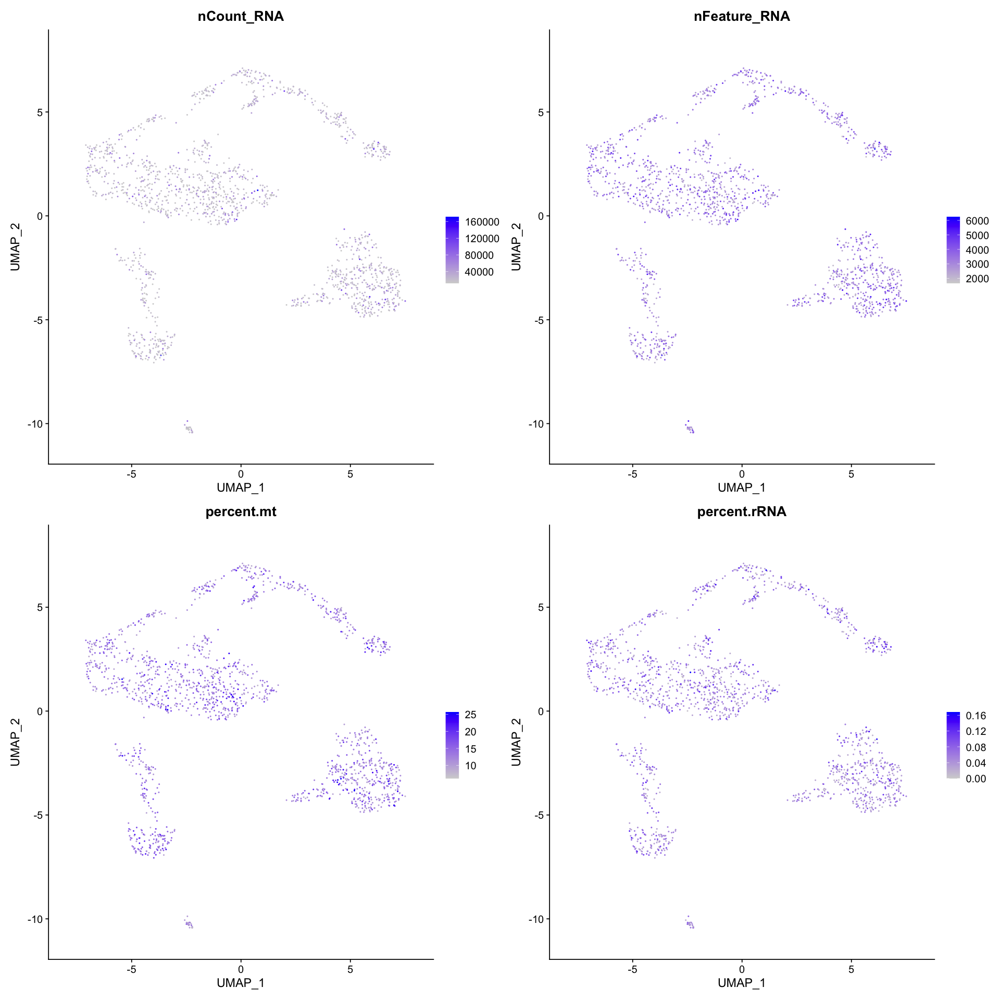

In [27]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC2, reduction = "umap", features = c("nCount_RNA", "nFeature_RNA", 
                               "percent.mt", "percent.rRNA"), pt.size = 0.2,  ncol = 2)

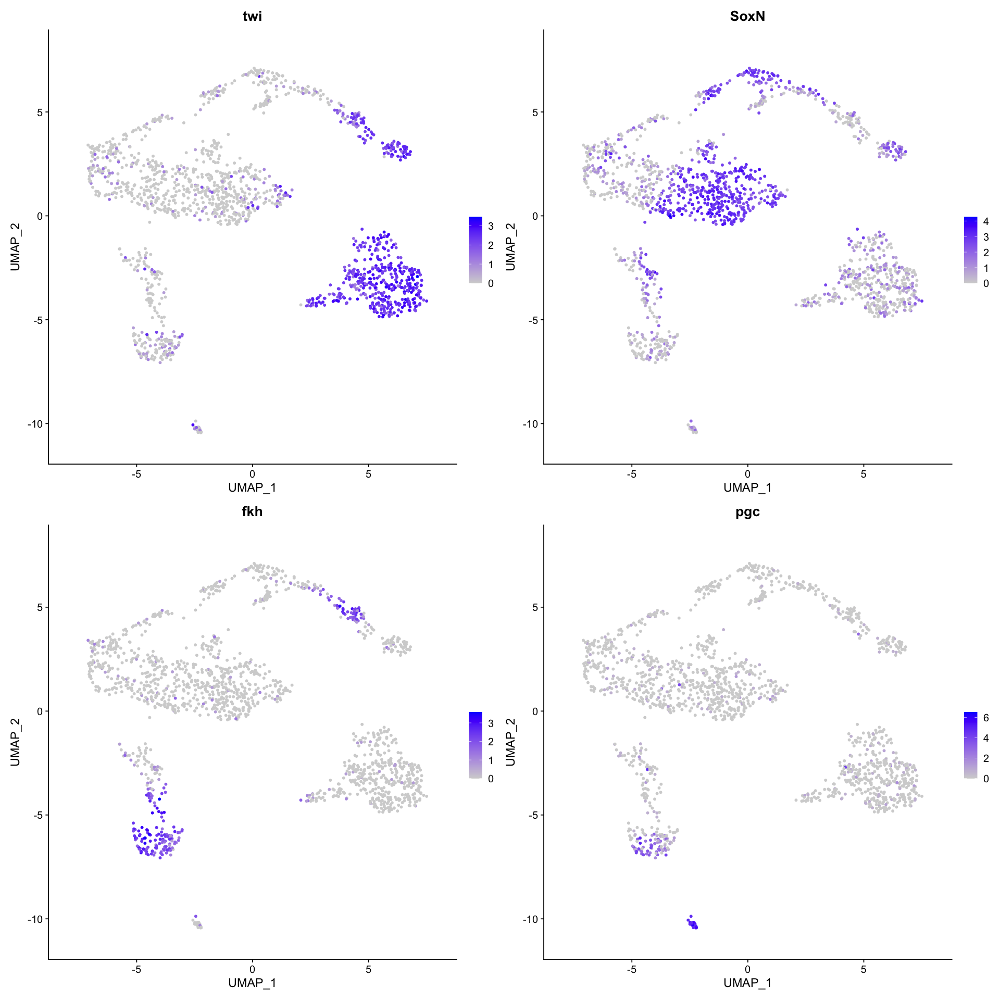

In [28]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC2, features = c('twi','SoxN','fkh','pgc'), ncol = 2, pt.size = 1)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1592
Number of edges: 56893

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.6660
Number of communities: 18
Elapsed time: 0 seconds


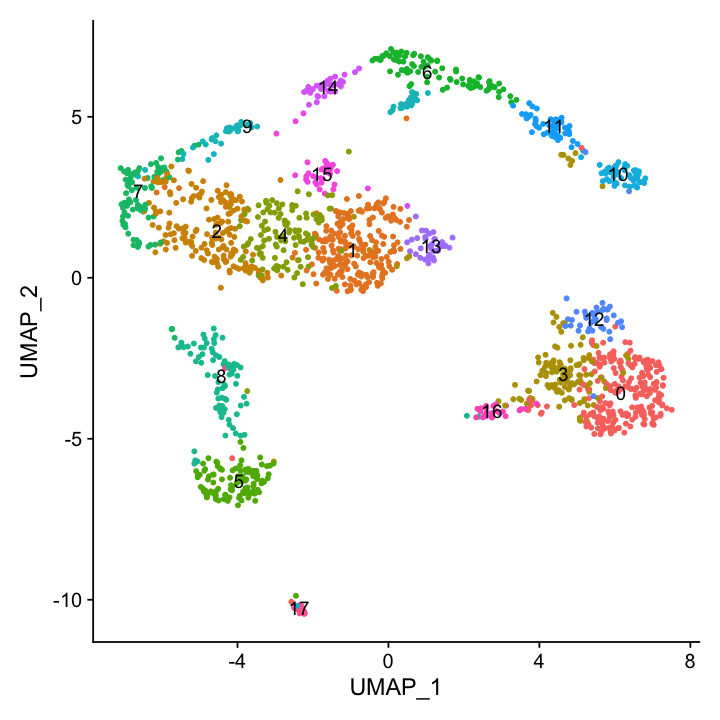

In [29]:
seu_HQC2 <- FindClusters(seu_HQC2, resolution = 2.0)
options(repr.plot.width=6, repr.plot.height=6)
DimPlot(seu_HQC2,label = TRUE) + NoLegend()

In [30]:
all.markers <- FindAllMarkers(seu_HQC2, only.pos = TRUE)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17



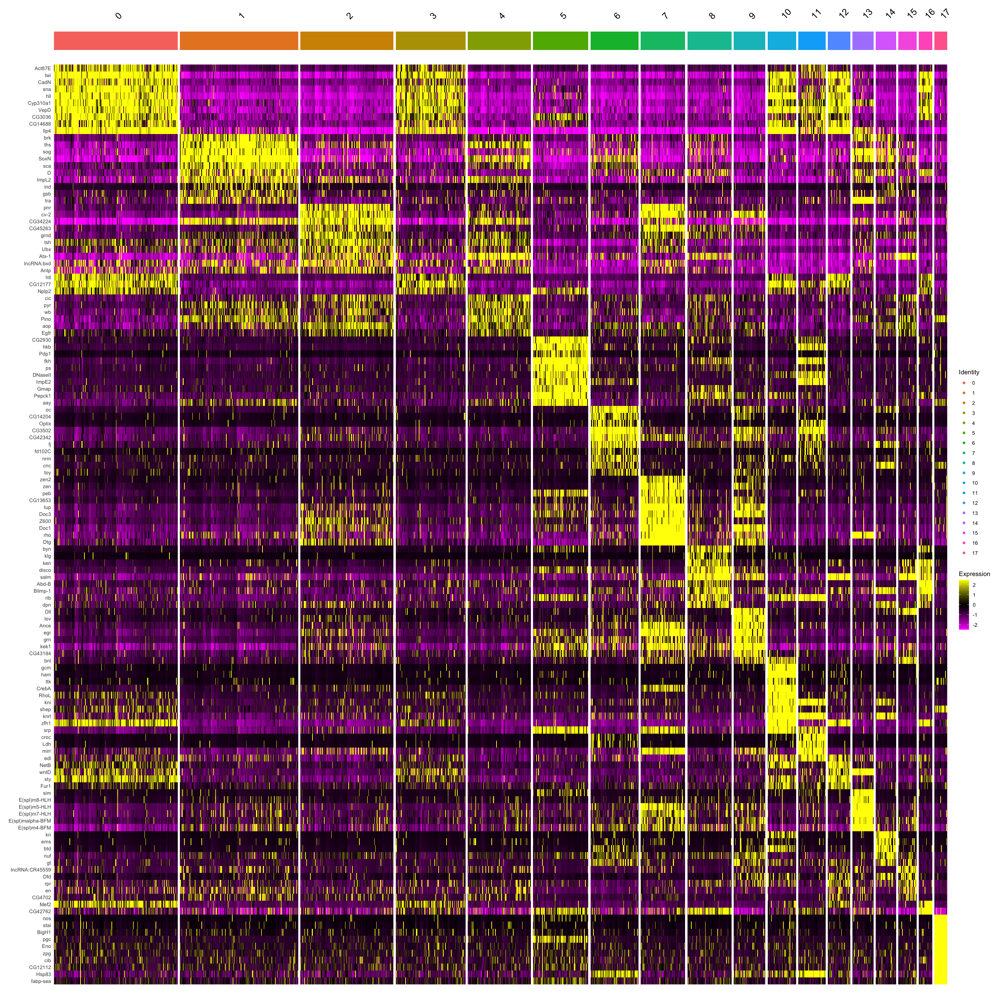

In [31]:
options(repr.plot.width=24, repr.plot.height=24)
DoHeatmap(seu_HQC2, features = all.markers.top10$gene)

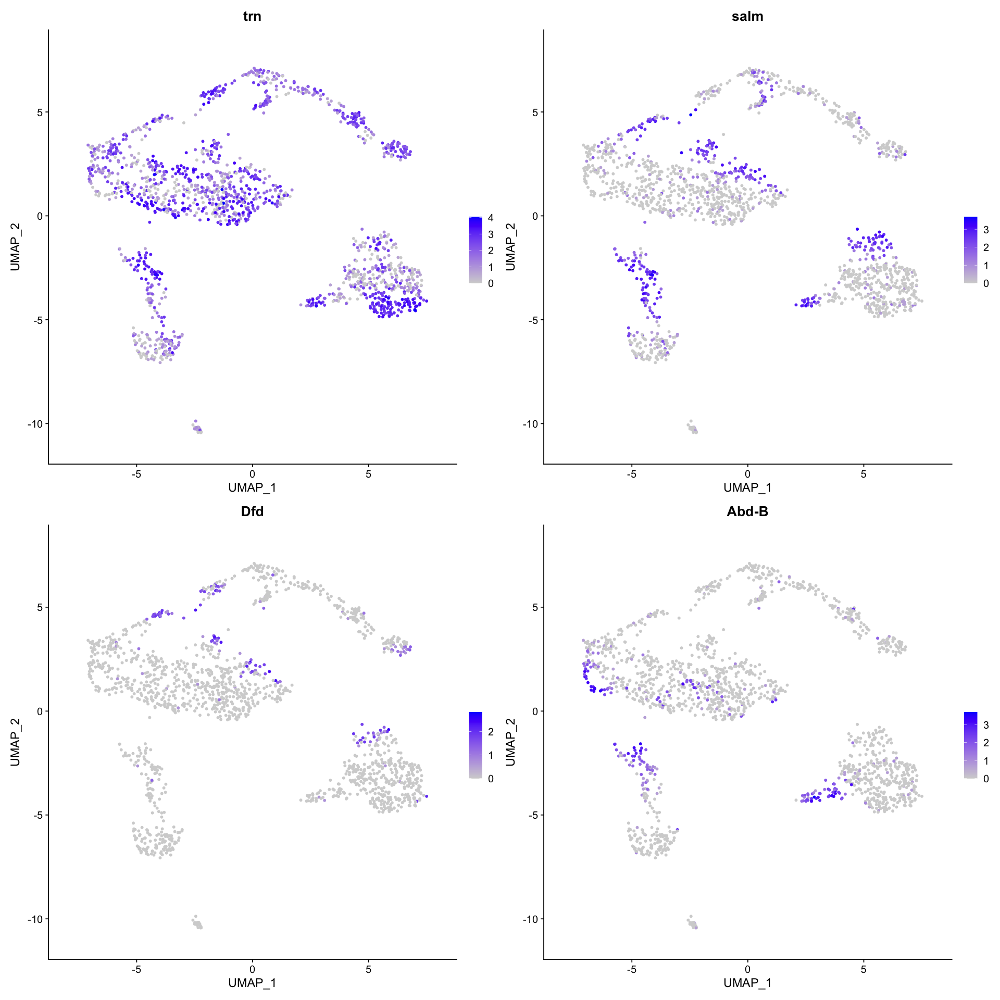

In [32]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC2, features = c('trn','salm','Dfd','Abd-B'), ncol = 2, pt.size = 1)

In [33]:
manual_ID <- as.data.frame(seu_HQC2$seurat_clusters)
colnames(manual_ID) <- c('manual_ID')
head(manual_ID)

manual_ID$manual_ID <- dplyr::recode(manual_ID$manual_ID, 
                                        "0" = "Trunk_mesoderm", #sna+, twi+
                                        "1" = "Medial_neuroectoderm", #SoxN+, sog+
                                        "2" = "Dorsal_ectoderm", #Atx-1+
                                        "3" = "Trunk_mesoderm", #sna+, twi+
                                        "4" = "Lateral_neuroectoderm", #SoxN+, sog-
                                        "5" = "Posterior_midgut", #fkh+, hkb+
                                        "6" = "Head_ectoderm", #oc
                                        "7" = "Amnioserosa", #zen
                                        "8" = "Ectoderm_PS14/Hindgut", #Abd-B+, byn+
                                        "9" = "Anterior_amnioserosa", #zen+, Antp-, Dll+
                                        "10" = "Anterior_mesoderm", #sna+, twi+, gcm+
                                        "11" = "Anterior_midgut", #fkh+, hkb+, CadN-
                                        "12" = "Mesoderm_PS1-3", #sna+, twi+, salm+, Dfd+
                                        "13" = "Midline_cells", #sim+, E(spl)-C+
                                        "14" = "Ectoderm_kn", #kn+
                                        "15" = "Dorsal_ectoderm_anterior", #salm+, Atx-1+, sog- 
                                        "16" = "Posterior_mesoderm", #Abd-B+, trn+
                                        "17" = "Pole_cells" #pgc+
                                     )


head(manual_ID)
seu_HQC2$annotated_seurat_clusters <- manual_ID

,manual_ID
,<fct>
GSM2494786_GTACCCATAAGA,1
GSM2494786_TCATCTTATACA,0
GSM2494786_CGAAGAACAAGA,0
GSM2494786_CAGAACAAACGA,4
GSM2494786_AGCTTACTAATC,1
GSM2494786_GTACGCAATCAT,7


,manual_ID
,<fct>
GSM2494786_GTACCCATAAGA,Medial_neuroectoderm
GSM2494786_TCATCTTATACA,Trunk_mesoderm
GSM2494786_CGAAGAACAAGA,Trunk_mesoderm
GSM2494786_CAGAACAAACGA,Lateral_neuroectoderm
GSM2494786_AGCTTACTAATC,Medial_neuroectoderm
GSM2494786_GTACGCAATCAT,Amnioserosa


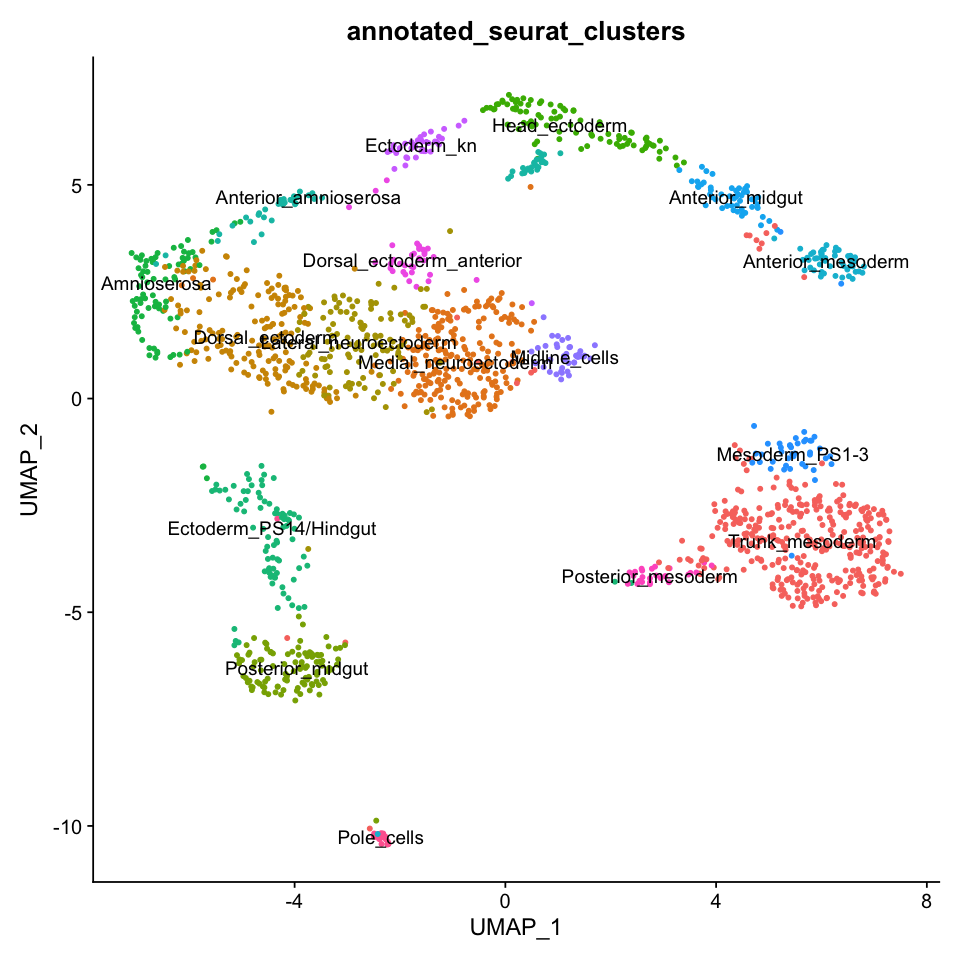

In [34]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC2, reduction =  "umap", label = TRUE, group.by = 'annotated_seurat_clusters') + NoLegend()

In [35]:
saveRDS(file = '../../data/seurat_object/NK-data/seu_HQC_NK.obj', object = seu_HQC2)

In [36]:
write.csv(all.markers, file = './all_markers_seurat_clusters.csv')

In [37]:
levels <- read.table(file="./seurat_clusters_rename_levels_color.txt")
colors <- levels[,2]
levels <- levels[,1]
head(levels)
length(levels)
head(colors)

[1] "Head_ectoderm"            "Ectoderm_kn"             
[3] "Dorsal_ectoderm_anterior" "Anterior_amnioserosa"    
[5] "Amnioserosa"              "Dorsal_ectoderm"

[1] 17

[1] "skyblue1"   "skyblue2"   "skyblue3"   "gray80"     "gray75"    
[6] "olivedrab1"

In [38]:
length(levels(seu_HQC2))
levels(seu_HQC2)
setdiff(seu_HQC2$annotated_seurat_clusters, levels)

[1] 18

[1] "0"  "1"  "2"  "3"  "4"  "5"  "6"  "7"  "8"  "9"  "10" "11" "12" "13" "14"
[16] "15" "16" "17"

character(0)

Saving 7 x 7 in image



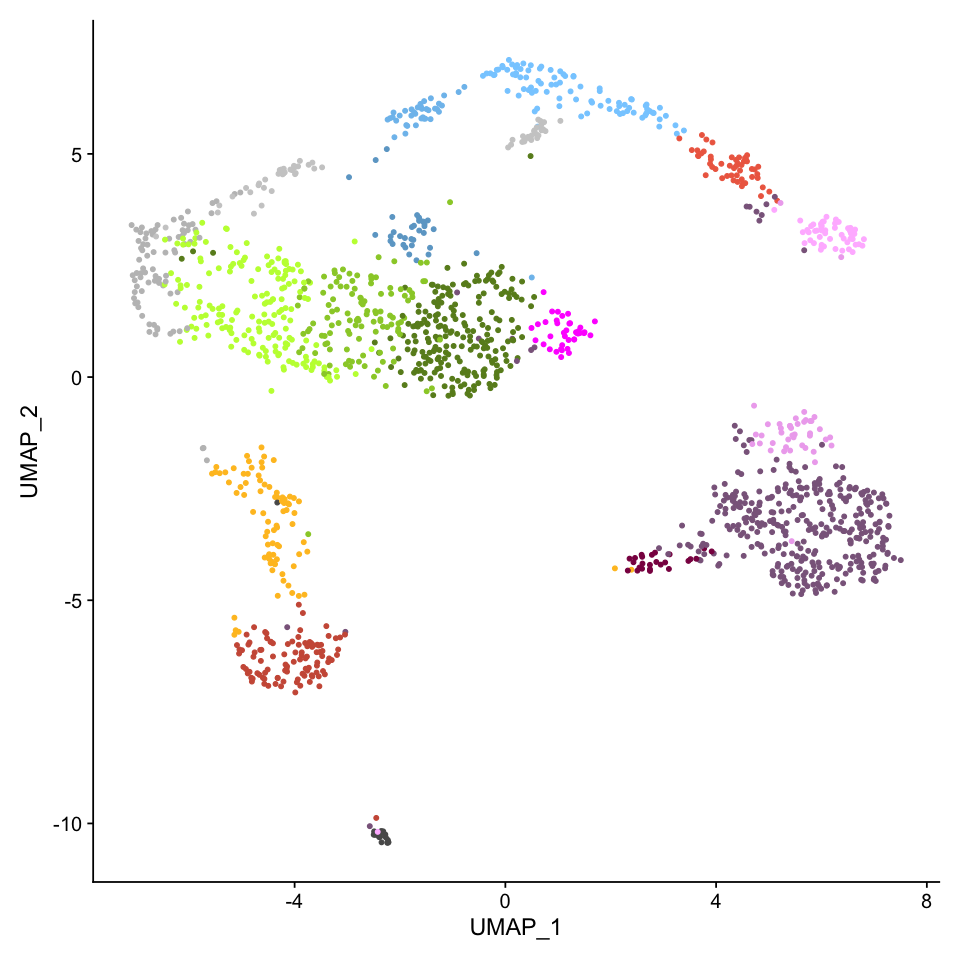

In [39]:
Idents(seu_HQC2) <- 'annotated_seurat_clusters'
levels(seu_HQC2) <- levels
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC2, reduction =  "umap", label = FALSE, cols = colors) + NoLegend() 
fig
ggsave(fig, file = "./figures/01_NK_normalize/seurat_cluster_umap_NK.eps", dpi = 300)

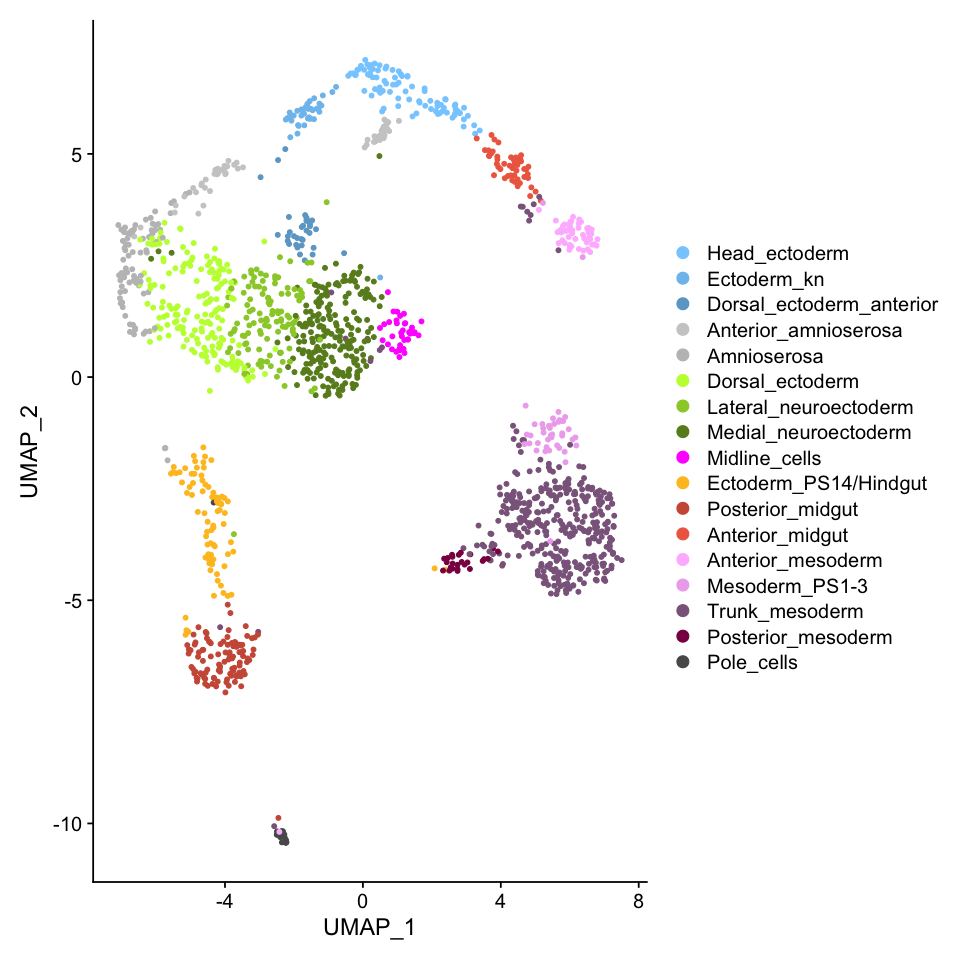

In [40]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC2, reduction =  "umap", label = FALSE, cols = colors)
fig
ggsave(fig, file = "./figures/01_NK_normalize/seurat_cluster_umap2_NK.eps", dpi = 300, width = 12, height = 8)

In [41]:
path = './figures/gene_expressions_on_UMAP'
features <- c("sna", "twi","CadN",
              "SoxN","dpp",
              "fkh","hkb","srp",
              "sim","E(spl)m8-HLH","gcm", "byn", "ct", "disco",
              "sog", "vnd", "ind", "Dr","Atx-1", "tup", "grn", "Doc2", "zen","peb",
              "trn","eve","ftz","en","wg",
              "Optix", "oc", "kn","salm","Dfd","Scr", "Antp", "Ubx", "abd-A","Abd-B")
for (name in features){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu_HQC2, features = name) + theme(plot.title = element_blank())
    basename = paste(name, 'NK_all_cells.eps',sep = '_')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

In [42]:
path = './figures/gene_expressions_on_UMAP'
features <- c("sna", "twi","CadN",
              "SoxN","dpp",
              "fkh","hkb","srp",
              "sim","E(spl)m8-HLH","gcm", "byn", "ct", "disco",
              "sog", "vnd", "ind", "Dr","Atx-1", "tup", "grn", "Doc2", "zen","peb",
              "trn","eve","ftz","en","wg",
              "Optix", "oc", "kn","salm","Dfd","Scr", "Antp", "Ubx", "abd-A","Abd-B")
for (name in features){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu_HQC2, features = name) + NoLegend() + theme(plot.title = element_blank())
    basename = paste(name, 'NK_all_cells_wo_scalebar.eps',sep = '_')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

In [43]:
seu_HQC2

An object of class Seurat 
24184 features across 1592 samples within 2 assays 
Active assay: SCT (10063 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [44]:
summary(seu_HQC$nCount_RNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  12522   15980   21818   27725   32518  171098 

In [45]:
summary(seu_HQC$nFeature_RNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1675    2601    3032    3206    3664    6241 

In [46]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] MAST_1.16.0                 SingleCellExperiment_1.12.0
 [3] SummarizedExperiment_1.20.0 Biobase_2.50.0             
 [5] GenomicRanges_1.42.0        GenomeInfoDb_1.26.2        
 [7] IRanges_2.24.1              S4Vectors_0.28.1           
 [9] BiocGenerics_0.36.0         MatrixGenerics_1.2.0       
[11] matrixStats_0.57.0          R.utils_2.10.1             
[13] R.oo_1.24.0                 R.methodsS3_1.8.1          
[15] ggplot2_3.3.3               dplyr_1.0.3   